### <h2 style="text-align:center;"><strong>How to - SpiDy</strong></h2>
<hr>

### Modules

In [1]:
include("../src/SpiDy.jl");
using .SpiDy

using LinearAlgebra
using DifferentialEquations
using FFTW
using Random
using Distributions
using Statistics
using Interpolations
using DSP
using Plots
using StatsBase
using NPZ
using Cubature

### Parameters

In [3]:
Δt = 0.15
N = 10_000
Random.seed!(123) # the exclamation mark here is warning us that we are changing a global property, in this case the random seed

J = LorentzianSD(1., 7., 5.);

### Classical noise

In [4]:
noise = ClassicalNoise(1.);
fpsd = psd(J, noise);
fspectrum = spectrum(noise);

#### Distribution

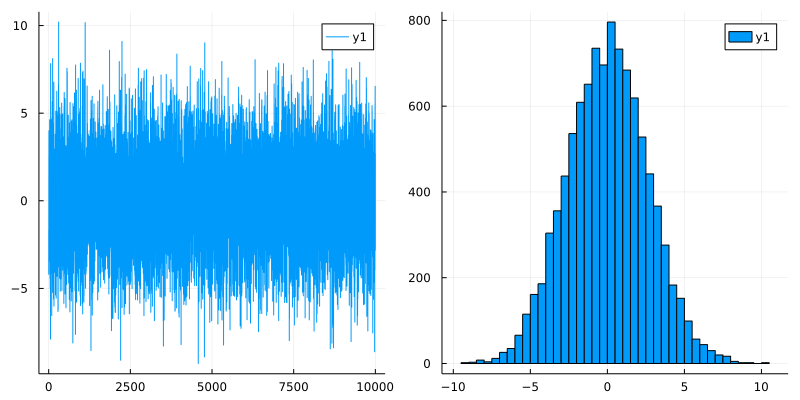

In [5]:
distro=Normal(0., 1/sqrt(Δt)); # This is the model distribution. Now we need to extract values from this distribution.
distrosample = rand(distro, N);
p1 = plot(distrosample);
p2 = histogram(distrosample);
plot(p1, p2; size=(800, 400))

#### Stochastic field

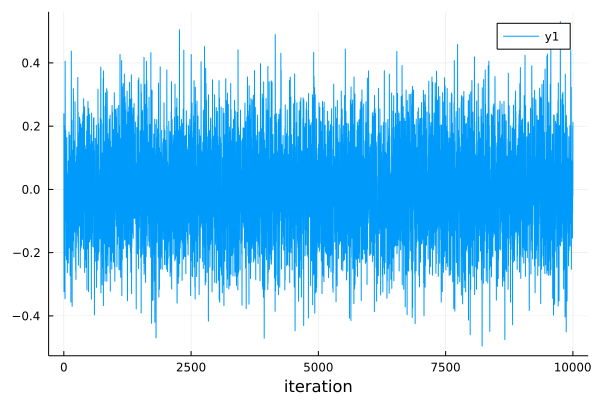

In [6]:
plot(bfield(N, Δt, J, noise; interpolation=false), xlabel="iteration")

#### Spectrum, imag(kernel) and psd

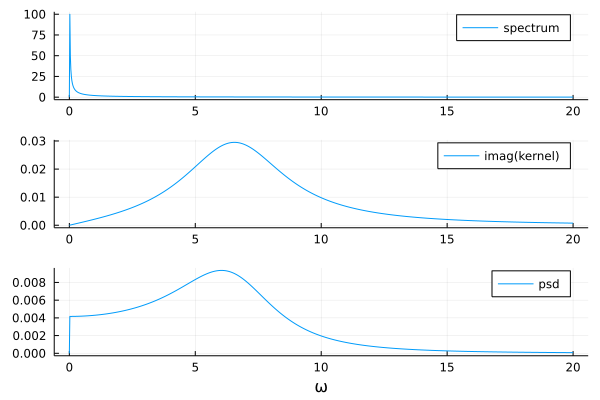

In [7]:
freqrange = LinRange(0, 20, 1000)
atest = spectrum(noise).(freqrange)
btest = imag.(kernel(J).(freqrange))
p1 = plot(freqrange, atest, label="spectrum");
p2 = plot(freqrange, btest, label="imag(kernel)");
p3 = plot(freqrange, atest.*btest, label="psd", xlabel = "ω")
plot(p1, p2, p3, layout=(3, 1))

#### Compare periodogram of the stochastic field with psd

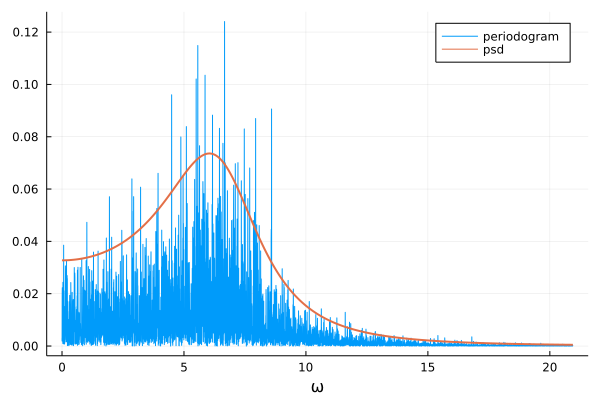

In [10]:
angfreq = 2π*rfftfreq(N, 1/Δt);
b = bfield(N, Δt, J, noise; interpolation=false)
psdperiodogram = periodogram(b, nfft=N, fs=1/Δt)
psdint = hquadrature(fpsd, angfreq[1], angfreq[end])[1]

plot(2π*freq(psdperiodogram), power(psdperiodogram), xlabel = "ω", label="periodogram")
plot!(angfreq, fpsd.(angfreq)/psdint*var(b)*25, lw=2, label="psd")

# The computed periodogram is normalized so that the area under the periodogram is
# equal to the uncentered variance (or average power) of the original signal

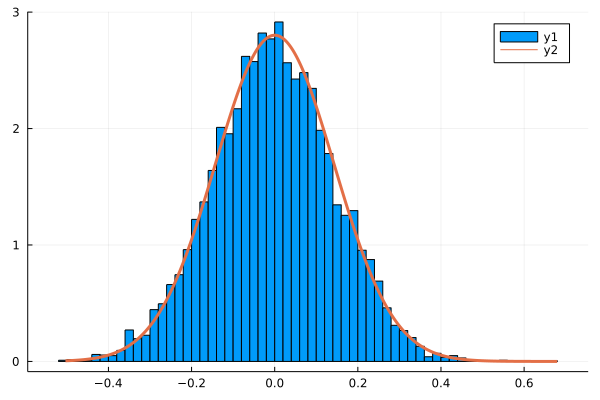

In [12]:
angfreq = 2π*rfftfreq(N, 1/Δt);
bvalues = bfield(N, Δt, J, noise; interpolation=false)

sigma = sqrt(2*hquadrature(fpsd, angfreq[1], angfreq[end])[1]/2π) # multiplied by 2 because the psd is performed only for positive omegas!!
gauss = x -> pdf(Normal(0.0, sigma), x)

xvals = LinRange(minimum(bvalues), maximum(bvalues), 1000)
histogram(bvalues, bins=100, normalize=true)
plot!(xvals, gauss.(xvals), lw=3)

### Quantum noise

In [13]:
noise = QuantumNoise(0.1);
fpsd = psd(J, noise);
fspectrum = spectrum(noise);

#### Distribution

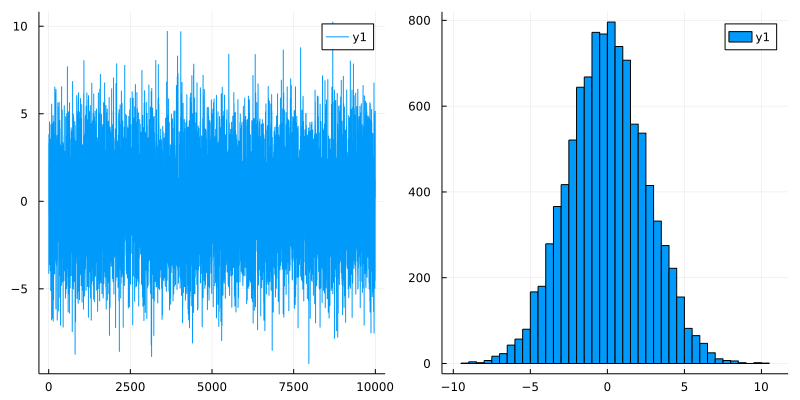

In [14]:
distro=Normal(0., 1/sqrt(Δt)); # This is the model distribution. Now we need to extract values from this distribution.
distrosample = rand(distro, N);
p1 = plot(distrosample);
p2 = histogram(distrosample);
plot(p1, p2; size=(800, 400))

#### Stochastic field

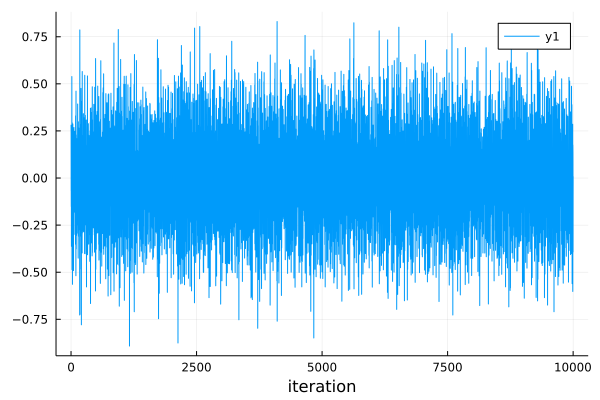

In [15]:
plot(bfield(N, Δt, J, noise; interpolation=false), xlabel="iteration")

#### Spectrum, imag(kernel) and psd

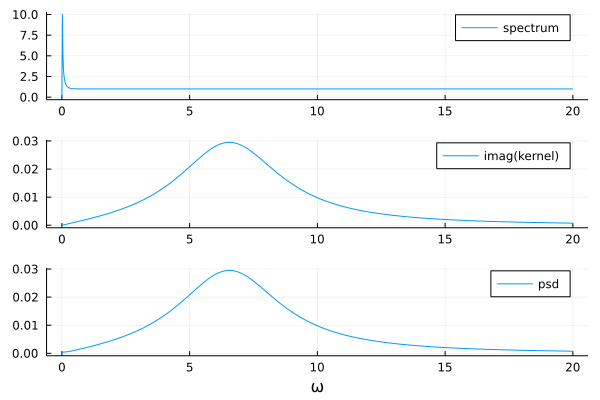

In [16]:
freqrange = LinRange(0, 20, 1000)
atest = spectrum(noise).(freqrange)
btest = imag.(kernel(J).(freqrange))
p1 = plot(freqrange, atest, label="spectrum");
p2 = plot(freqrange, btest, label="imag(kernel)");
p3 = plot(freqrange, atest.*btest, label="psd", xlabel = "ω")
plot(p1, p2, p3, layout=(3, 1))

#### Compare periodogram of the stochastic field with psd

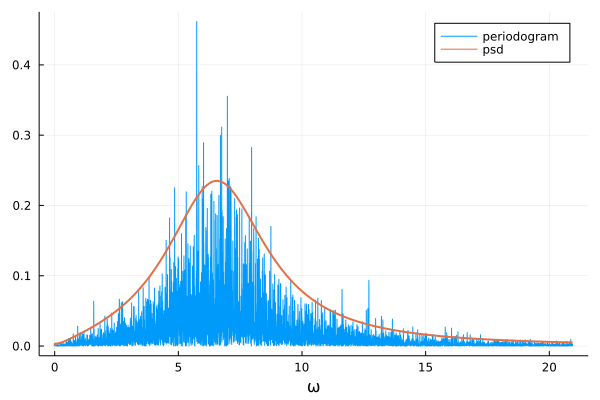

In [17]:
angfreq = 2π*rfftfreq(N, 1/Δt);
b = bfield(N, Δt, J, noise; interpolation=false)
psdperiodogram = periodogram(b, nfft=N, fs=1/Δt)
psdint = hquadrature(fpsd, angfreq[1], angfreq[end])[1]

plot(2π*freq(psdperiodogram), power(psdperiodogram), xlabel = "ω", label="periodogram")
plot!(angfreq, fpsd.(angfreq)/psdint*var(b)*25, lw=2, label="psd")

# The computed periodogram is normalized so that the area under the periodogram is
# equal to the uncentered variance (or average power) of the original signal

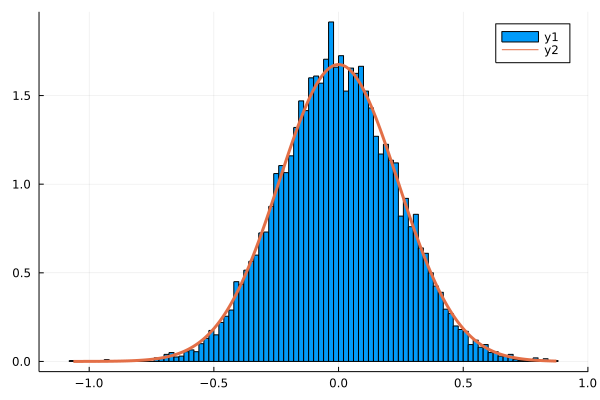

In [18]:
angfreq = 2π*rfftfreq(N, 1/Δt);
bvalues = bfield(N, Δt, J, noise; interpolation=false)

sigma = sqrt(2*hquadrature(fpsd, angfreq[1], angfreq[end])[1]/2π) # multiplied by 2 because the psd is performed only for positive omegas!!
gauss = x -> pdf(Normal(0.0, sigma), x)

xvals = LinRange(minimum(bvalues), maximum(bvalues), 1000)
histogram(bvalues, bins=100, normalize=true)
plot!(xvals, gauss.(xvals), lw=3)

### Coupling tensor

In [19]:
matrix = IsoCoupling(2.);
matrix.C

2.0

In [20]:
matrix = AnisoCoupling([-sin(π/4) 0. 0.
                        0. 0. 0.
                        cos(π/4) 0. 0.]);
matrix.C

3×3 Matrix{Float64}:
 -0.707107  0.0  0.0
  0.0       0.0  0.0
  0.707107  0.0  0.0

### Dynamics

In [21]:
tspan = (0., N*Δt)
saveat = (0:1:N)*Δt
noise = ClassicalNoise(1.);
s0 = [0., 0., -1.]
bfields = [bfield(N, Δt, J, noise),
           bfield(N, Δt, J, noise),
           bfield(N, Δt, J, noise)];

sol = diffeqsolver(s0, tspan, J, bfields, matrix; saveat=saveat);

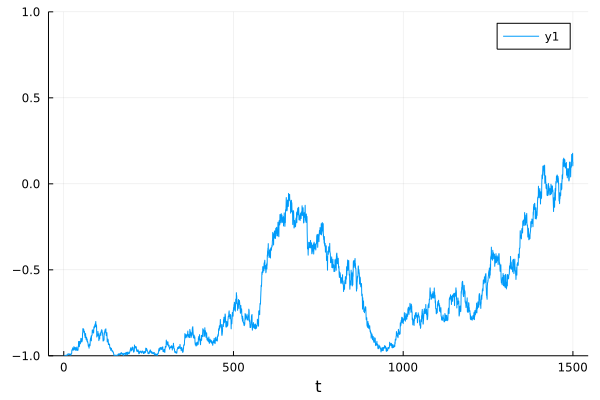

In [22]:
plot(sol[1], sol[2][:, 3], ylim=(-1,1), xlabel="t")

### Dynamics averaged

In [31]:
tspan = (0., N*Δt)
saveat = (0:1:N)*Δt
noise = ClassicalNoise(1.);
s0 = [0., 0., -1.]

navg = 2

sols = zeros(navg, length(saveat), 3)
for i in 1:navg
    bfields = [bfield(N, Δt, J, noise),
               bfield(N, Δt, J, noise),
               bfield(N, Δt, J, noise)];
    sol = diffeqsolver(s0, tspan, J, bfields, matrix; saveat=saveat);
    sols[i, :, :] = sol[2]
end
solavg = mean(sols, dims=1)[1, :, :];

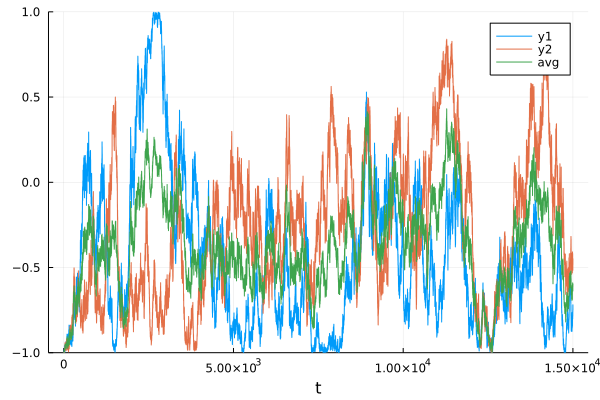

In [32]:
plot(saveat, sols[1, :, 3])
plot!(saveat, sols[2, :, 3])
plot!(saveat, solavg[:, 3], label="avg", ylim=(-1, 1), xlabel="t")

### Steady-state

In [23]:
tspan = (0., N*Δt)
saveat = ((N*4÷5):1:N)*Δt # NB: now, we save only the late-time dynamics to evaluate the steady-state value
noise = ClassicalNoise(1.);
s0 = normalize(rand(3))
bfields = [bfield(N, Δt, J, noise),
           bfield(N, Δt, J, noise),
           bfield(N, Δt, J, noise)];

sol = diffeqsolver(s0, tspan, J, bfields, matrix; saveat=saveat);

s = mean(sol[2], dims=1)

1×3 Matrix{Float64}:
 -0.0012761  -0.00495519  -0.371981

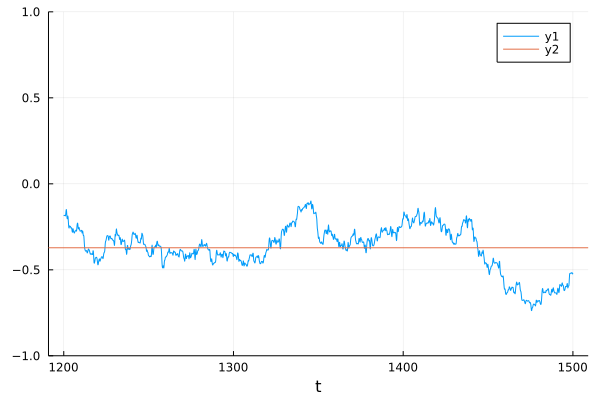

In [24]:
plot(sol[1], sol[2][:, 3], ylim=(-1,1), xlabel="t")
hline!([s[3]])

### Steady-state averaged

In [116]:
tspan = (0., N*Δt)
saveat = ((N*4÷5):1:N)*Δt # NB: now, we save only the late-time dynamics to evaluate the steady-state value

T = 10 .^ LinRange(-3, 3, 24) # range of temperatures where to evaluate the noise
navg = 1 # number of stochastic field realizations to average

Sss = zeros(length(T), 3)
for n in 1:length(T)
    noise = ClassicalNoise(T[n]);
    s = zeros(navg, 3)
    for i in 1:navg
        s0 = normalize(rand(3))
        bfields = [bfield(N, Δt, J, noise),
                   bfield(N, Δt, J, noise),
                   bfield(N, Δt, J, noise)];
        sol = diffeqsolver(s0, tspan, J, bfields, matrix; saveat=saveat);
        s[i, :] = mean(sol[2], dims=1)
    end
    Sss[n, :] = mean(s, dims=1)
end

In [22]:
Sss

24×3 Matrix{Float64}:
  0.0101467     2.08921e-5   -0.998931
  0.0100897    -3.51028e-5   -0.995953
  0.00991739   -9.52153e-6   -0.990975
  0.0101797    -4.03106e-5   -0.998137
  0.00990469   -6.03024e-5   -0.989141
  0.00983249    1.00005e-5   -0.995276
  0.00959368    0.000115013  -0.968134
  0.00886908    0.000141778  -0.955103
  0.00736447    0.000108609  -0.906114
  0.00501024   -0.000180865  -0.813908
  ⋮                          
  0.00264203   -0.00024445   -0.139652
 -0.00096203    0.000608469   0.0150082
 -0.000599759  -0.000403277  -0.0694916
  0.00318298    8.06354e-5    0.0253357
  0.00167408    0.000490001   0.0616659
  0.00246678   -0.000550251  -0.0157358
  0.0252615     0.000294599  -0.0355024
 -0.0138582     0.000474951   0.022795
 -0.0106898    -0.000469867   0.00669915

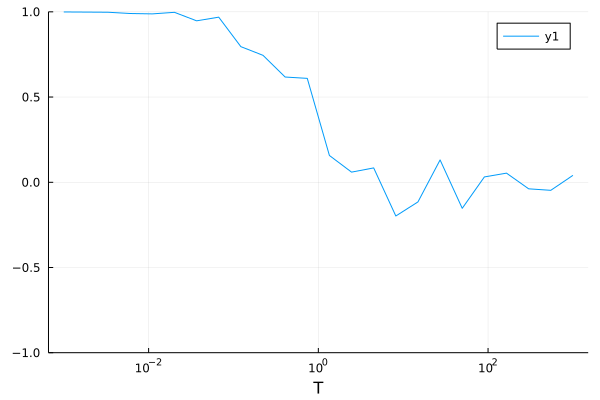

In [117]:
plot(T, -Sss[:, 3], xscale=:log10, ylim=(-1, 1), xlabel="T")

### <h2 style="text-align:center"><strong>But this is how the code should be used</strong></h2>

* Install and start Julia
* \>\>\> **]**
* \>\>\> **add https://github.com/quantum-exeter/SpiDy.jl**

Run the following from the terminal (where '10' identifies the number of threads you want to use):
* **julia -t 10 src/run_dynamics.jl**

Once the script has finished, load the file created:

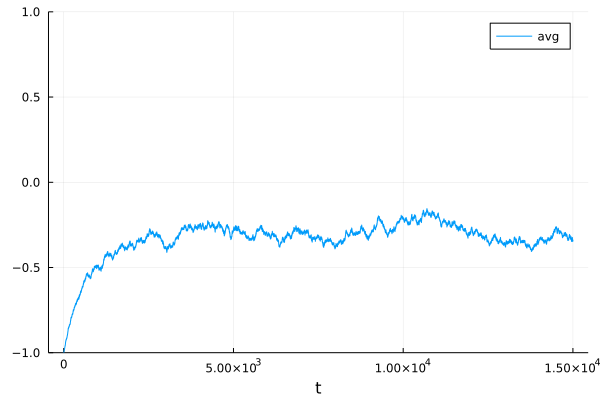

In [31]:
data = npzread("./test.npz");
plot(data["T"], data["S"][:, 3], label="avg", ylim=(-1, 1), xlabel="t")

### <h2 style="text-align:center"><strong>Possible implementation</strong></h2>

* Add the capability to handle dynamics for different spectral densities by overloading the **diffeqsolver** function

### <h2 style="text-align:center"><strong>Comparison with the ASHCodeParallel results</strong></h2>

* movert curve
* bfield (in ASHCodeParallel python notebook)
* issue: factor 2\pi in the bfield's psdfft?